In [0]:
# Install pycoco tools. Also store tensorflow/models folder.
!pip install pycocotools

In [3]:
# Now import various libraries
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
#import tensorflow.compat.v1 as tf
import zipfile
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

In [4]:
# Import the objection modules
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Patches:

In [5]:
# These patches are requires to use tensorflow 1 functions.
utils_ops.tf = tf.compat.v1
tf.gfile = tf.io.gfile

In [6]:
# Load the object detection model
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [7]:
# List of the strings that is used to add correct label for each box.
# Label maps map indices to category names Eg :- 5 corresponds to airplane.
PATH_TO_LABELS = 'object_detection/data/oid_v4_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [8]:
# These images the would be used to test the model
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))
TEST_IMAGE_PATHS

[PosixPath('object_detection/test_images/bed.jpeg'),
 PosixPath('object_detection/test_images/car.jpeg'),
 PosixPath('object_detection/test_images/dining_table.jpeg'),
 PosixPath('object_detection/test_images/fridge.jpeg'),
 PosixPath('object_detection/test_images/image.jpeg'),
 PosixPath('object_detection/test_images/image4.jpeg'),
 PosixPath('object_detection/test_images/laptop.jpeg'),
 PosixPath('object_detection/test_images/sofa.jpeg'),
 PosixPath('object_detection/test_images/tv.jpeg')]

# Detection

Load an object detection model:

In [29]:
# Load the model
model_name = 'ssd_mobilenet_v2_oid_v4_2018_12_12'
detection_model = load_model(model_name)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [7]:
model_dir = 'faster_rcnn_inception_resnet_v2_atrous_oid_v4_2018_12_12/saved_model'
model = tf.saved_model.load(str(model_dir))
model = model.signatures['serving_default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [13]:
# Function to run inference on a single image
def run_inference_for_single_image(model, image):
  # Save image as a numpy array  
  image = np.asarray(image)
  # Convert image to tensor format
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, hence a new axis is added
  input_tensor = input_tensor[tf.newaxis,...]

  # Feed the image to the model
  output_dict = model(input_tensor)

  # This tells the number of objects detected in the image
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # Converting detected classes to int
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    
  return output_dict

Run it on each test image and show the results:

In [17]:
def show_inference(model, image_path):
  # Convert the image to numpy format
  image_np = np.array(Image.open(image_path))
  # Perform the inference using the model on one image
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualize the results. The predicted classes, scores and bounding boxes will be displayed
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
    
  display(Image.fromarray(image_np))
  #print(output_dict)

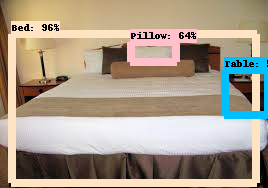

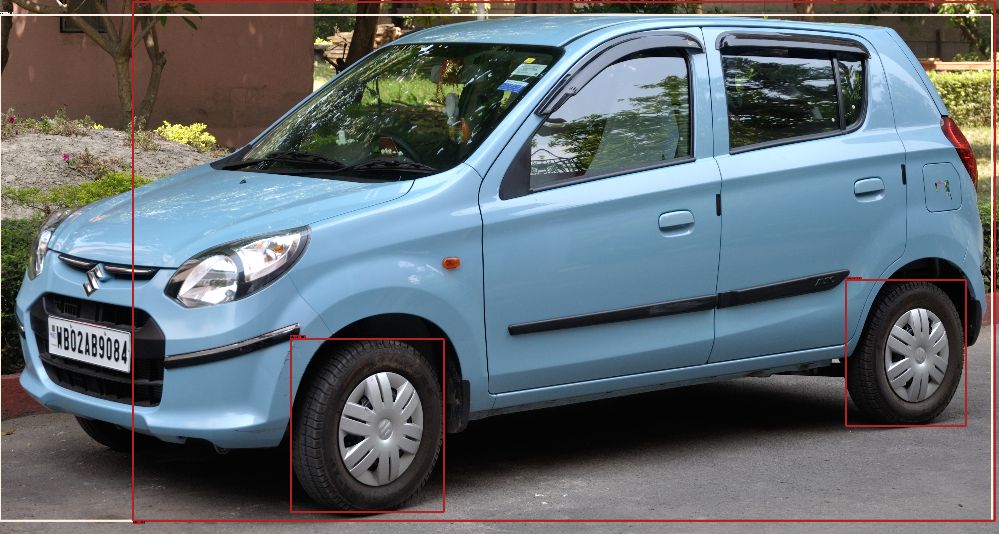

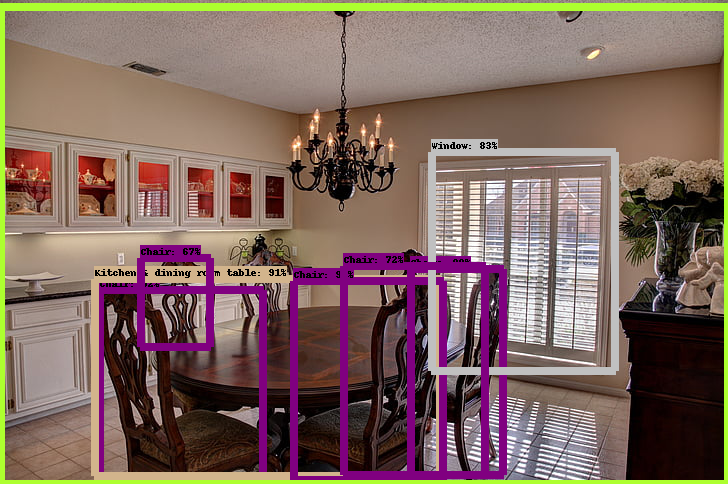

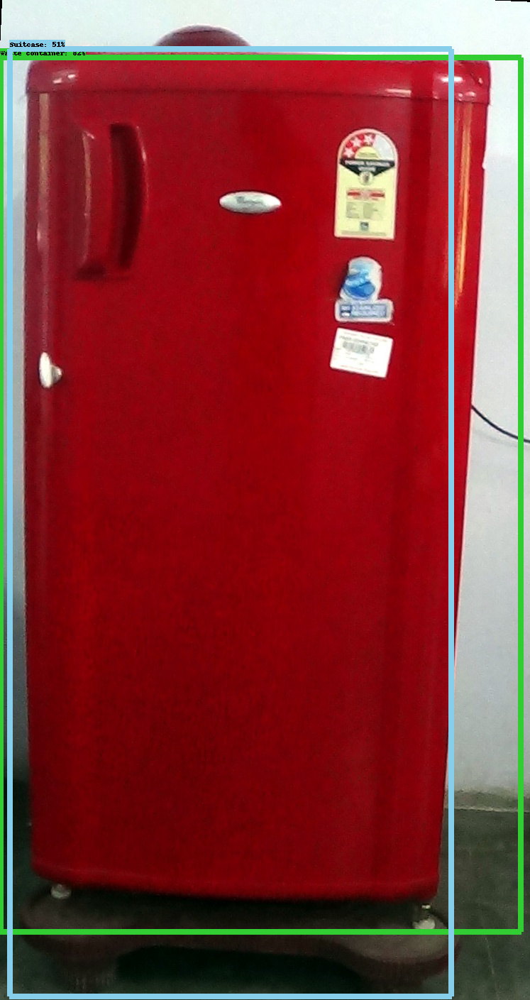

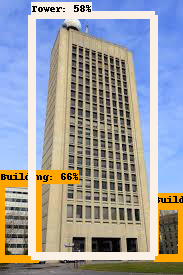

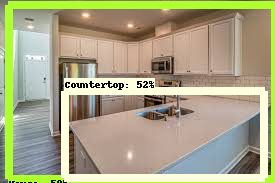

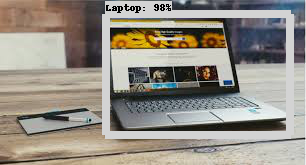

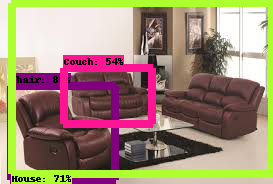

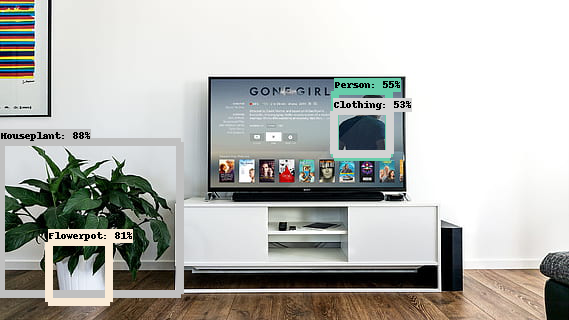

In [18]:
# For very image in TEST_IMAGE_PATHS, inference is performed using the model

for image_path in TEST_IMAGE_PATHS:
  show_inference(model, image_path)
